In [1]:
import pandas as pd
import numpy as np

Regression Problem: Predicting MPG based on the following features
    - cylinders
    - displacement
    - horsepower
    - weight
    - acceleration
    - year
    - origin
    - model

Classification Problem: Can we make a logistic regression model
that can predict the car name given the features
    - mpg 
    - cylinders
    - displacement
    - horsepower
    - weight
    - acceleration
    - year
    - origin

Let's import the data from cars.csv

In [2]:
df_cars = pd.read_csv('cars.csv')

Quick Look

In [3]:
df_cars.head()

,mpg,cylinders,displacement,horsepower,weight,acceleration,model year,origin,car name
0,18.0,8,307.0,130,3504,12.0,70,1,chevrolet chevelle malibu
1,15.0,8,350.0,165,3693,11.5,70,1,buick skylark 320
2,18.0,8,318.0,150,3436,11.0,70,1,plymouth satellite
3,16.0,8,304.0,150,3433,12.0,70,1,amc rebel sst
4,17.0,8,302.0,140,3449,10.5,70,1,ford torino


In [4]:
df_cars.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 398 entries, 0 to 397
Data columns (total 9 columns):
 #   Column        Non-Null Count  Dtype  
---  ------        --------------  -----  
 0   mpg           398 non-null    float64
 1   cylinders     398 non-null    int64  
 2   displacement  398 non-null    float64
 3   horsepower    398 non-null    object 
 4   weight        398 non-null    int64  
 5   acceleration  398 non-null    float64
 6   model year    398 non-null    int64  
 7   origin        398 non-null    int64  
 8   car name      398 non-null    object 
dtypes: float64(3), int64(4), object(2)
memory usage: 28.1+ KB


From the 8 columns, we can see that horse power has been formatted as a object (non-parametric), and should be parametric.

Let's convert it into float64



In [5]:
df_cars['horsepower'] = pd.to_numeric(df_cars['horsepower'], errors='coerce')

Call the .info again

In [6]:
df_cars["car name"].info()
df_cars[['Model', 'Brand']] = df_cars['car name'].apply(lambda x: [i.strip() for i in x.split(', ') if i.strip()])

print(df_cars)

<class 'pandas.core.series.Series'>
RangeIndex: 398 entries, 0 to 397
Series name: car name
Non-Null Count  Dtype 
--------------  ----- 
398 non-null    object
dtypes: object(1)
memory usage: 3.2+ KB


ValueError: Columns must be same length as key

Now the horse power is a float64, and we can proceed with our analysis.

Now the horse power is a float64, and we can proceed with our analysis.

It could be useful to generate two new columns at the he same time, one for the brand and another forfor the model. Let's do this. By first generating the two columns Brand and model and applying the same length as car name column_ 

In [7]:
# Displaying the info of the "car name" column
car_name_info = df_cars["car name"].info()

# Creating 'Model' and 'Brand' columns from 'car name'
df_cars[['Brand', 'Model']] = pd.DataFrame(df_cars['car name'].apply(lambda x: [i.strip() for i in x.split(', ')]).tolist(), index=df_cars.index)

# Display the updated dataframe
import ace_tools as tools; tools.display_dataframe_to_user(name="Updated df_cars", dataframe=df_cars)

df_cars.head(), car_name_info

<class 'pandas.core.series.Series'>
RangeIndex: 398 entries, 0 to 397
Series name: car name
Non-Null Count  Dtype 
--------------  ----- 
398 non-null    object
dtypes: object(1)
memory usage: 3.2+ KB


ValueError: Columns must be same length as key

In [ ]:
import ace_tools as tools


In [11]:

# Split the "car name" column into "Brand" and "Model" while ensuring two values are returned per row
df_cars[['Brand', 'Model']] = df_cars['car name'].apply(lambda x: x.split(', ') if ', ' in x else [x, '']).apply(pd.Series)

# Drop the "car name" column
df_cars.drop(columns=['car name'], inplace=True)


df_cars.head()

,mpg,cylinders,displacement,horsepower,weight,acceleration,model year,origin,Brand,Model
0,18.0,8,307.0,130.0,3504,12.0,70,1,chevrolet chevelle malibu,
1,15.0,8,350.0,165.0,3693,11.5,70,1,buick skylark 320,
2,18.0,8,318.0,150.0,3436,11.0,70,1,plymouth satellite,
3,16.0,8,304.0,150.0,3433,12.0,70,1,amc rebel sst,
4,17.0,8,302.0,140.0,3449,10.5,70,1,ford torino,


also it could be nice to add an extra column that shows the name of the he car

In [12]:
df_cars.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 398 entries, 0 to 397
Data columns (total 10 columns):
 #   Column        Non-Null Count  Dtype  
---  ------        --------------  -----  
 0   mpg           398 non-null    float64
 1   cylinders     398 non-null    int64  
 2   displacement  398 non-null    float64
 3   horsepower    392 non-null    float64
 4   weight        398 non-null    int64  
 5   acceleration  398 non-null    float64
 6   model year    398 non-null    int64  
 7   origin        398 non-null    int64  
 8   Brand         398 non-null    object 
 9   Model         398 non-null    object 
dtypes: float64(4), int64(4), object(2)
memory usage: 31.2+ KB


In [13]:
# Splitting 'Brand' into the first word and appending the rest to 'Model'
df_cars['Model'] = df_cars.apply(lambda row: row['Model'] if row['Brand'] == row['Brand'].split()[0] else ' '.join(row['Brand'].split()[1:]) + ' ' + row['Model'], axis=1)
df_cars['Brand'] = df_cars['Brand'].apply(lambda x: x.split()[0])

df_cars.head()

,mpg,cylinders,displacement,horsepower,weight,acceleration,model year,origin,Brand,Model
0,18.0,8,307.0,130.0,3504,12.0,70,1,chevrolet,chevelle malibu
1,15.0,8,350.0,165.0,3693,11.5,70,1,buick,skylark 320
2,18.0,8,318.0,150.0,3436,11.0,70,1,plymouth,satellite
3,16.0,8,304.0,150.0,3433,12.0,70,1,amc,rebel sst
4,17.0,8,302.0,140.0,3449,10.5,70,1,ford,torino


correlations 

We leave out any non-parametric value 

In [33]:
pd.get_dummies(df_cars, columns=['Brand', 'Model']).corr().style.background_gradient(cmap='coolwarm')

In [34]:
import pandas as pd

# One-hot encode the 'Brand' and 'Model' columns
df_cars_onehot = pd.get_dummies(df_cars, columns=['Brand', 'Model'])

# Compute the correlation matrix of the one-hot encoded dataframe
corr_matrix = df_cars_onehot.corr()

# Style the correlation matrix for better visualization
styled_corr_matrix = corr_matrix.style.background_gradient(cmap='coolwarm')

# Save the styled correlation matrix to an HTML file
styled_corr_matrix.to_html('cars_brand_model_correlation.html')


corr_matrix["Brand"].sort_values(ascending=False)

In [37]:
corr_matrix["mpg"].sort_values(ascending=False)

mpg             1.000000
model year      0.579267
origin          0.563450
acceleration    0.420289
Brand_vw        0.245689
                  ...   
Brand_ford     -0.187628
cylinders      -0.775396
horsepower     -0.778427
displacement   -0.804203
weight         -0.831741
Name: mpg, Length: 345, dtype: float64

In [38]:
corr_matrix["cylinders"].sort_values(ascending=False)

cylinders           1.000000
displacement        0.950721
weight              0.896017
horsepower          0.842983
Brand_oldsmobile    0.164921
                      ...   
Brand_toyota       -0.185119
model year         -0.348746
acceleration       -0.505419
origin             -0.562543
mpg                -0.775396
Name: cylinders, Length: 345, dtype: float64

NameError: name 'plt' is not defined

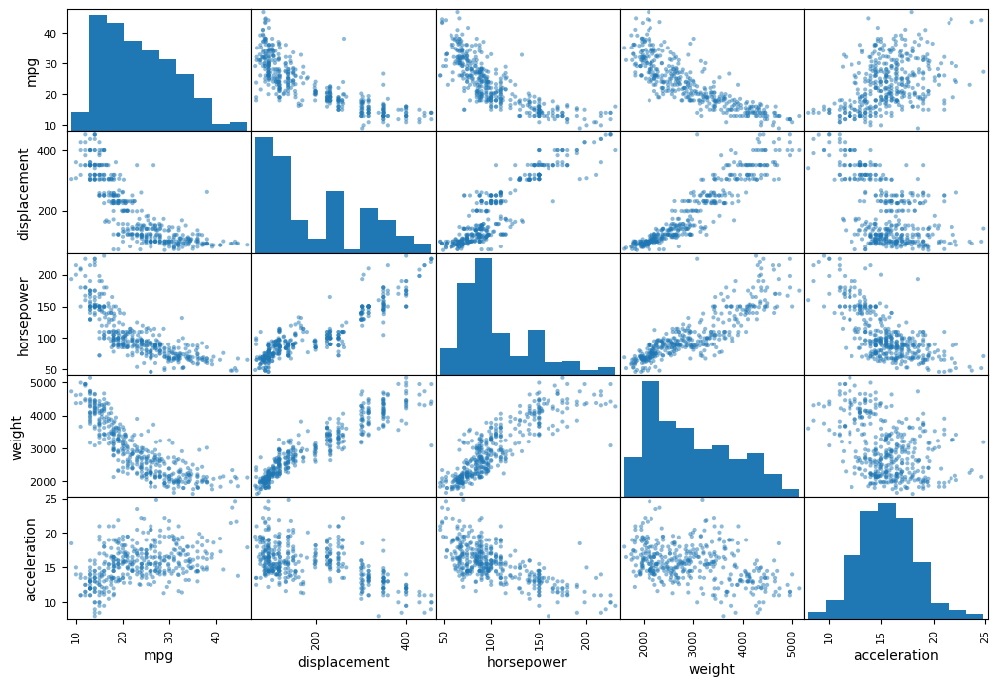

In [42]:
from pandas.plotting import scatter_matrix
from matplotlib import pyplot as plt
attr = ['mpg', 'displacement', 'horsepower', 'weight', 'acceleration']
scatter_matrix(df_cars_onehot[attr], figsize=(12,8))
plt.show()
plt.savefig('cars_scatter')